Run with `/home/jiahuikchen/miniconda3/envs/bagel`  
BAGEL weights already saved to `/checkpoint/dream_v2/transfusion/BAGEL-7B-MoT`

In [ ]:
# Copyright 2025 Bytedance Ltd. and/or its affiliates.
# SPDX-License-Identifier: Apache-2.0

%load_ext autoreload
%autoreload 2

import os
from copy import deepcopy
from typing import (
    Any,
    AsyncIterable,
    Callable,
    Dict,
    Generator,
    List,
    NamedTuple,
    Optional,
    Tuple,
    Union,
)
import requests
from io import BytesIO

from PIL import Image
import torch
from accelerate import infer_auto_device_map, load_checkpoint_and_dispatch, init_empty_weights

from data.transforms import ImageTransform
from data.data_utils import pil_img2rgb, add_special_tokens
from modeling.bagel import (
    BagelConfig, Bagel, Qwen2Config, Qwen2ForCausalLM, SiglipVisionConfig, SiglipVisionModel
)
from modeling.qwen2 import Qwen2Tokenizer
from modeling.bagel.qwen2_navit import NaiveCache
from modeling.autoencoder import load_ae
from safetensors.torch import load_file

## Model Initialization

In [4]:
from huggingface_hub import snapshot_download

save_dir = "/checkpoint/dream_v2/transfusion/BAGEL-7B-MoT"
repo_id = "ByteDance-Seed/BAGEL-7B-MoT"
cache_dir = save_dir + "/cache"

snapshot_download(cache_dir=cache_dir,
  local_dir=save_dir,
  repo_id=repo_id,
  local_dir_use_symlinks=False,
  resume_download=True,
  allow_patterns=["*.json", "*.safetensors", "*.bin", "*.py", "*.md", "*.txt"],
)
model_path = save_dir  # Download from https://huggingface.co/ByteDance-Seed/BAGEL-7B-MoT

# LLM config preparing
llm_config = Qwen2Config.from_json_file(os.path.join(model_path, "llm_config.json"))
llm_config.qk_norm = True
llm_config.tie_word_embeddings = False
llm_config.layer_module = "Qwen2MoTDecoderLayer"

# ViT config preparing
vit_config = SiglipVisionConfig.from_json_file(os.path.join(model_path, "vit_config.json"))
vit_config.rope = False
vit_config.num_hidden_layers = vit_config.num_hidden_layers - 1

# VAE loading
vae_model, vae_config = load_ae(local_path=os.path.join(model_path, "ae.safetensors"))

# Bagel config preparing
config = BagelConfig(
    visual_gen=True,
    visual_und=True,
    llm_config=llm_config, 
    vit_config=vit_config,
    vae_config=vae_config,
    vit_max_num_patch_per_side=70,
    connector_act='gelu_pytorch_tanh',
    latent_patch_size=2,
    max_latent_size=64,
)

with init_empty_weights():
    language_model = Qwen2ForCausalLM(llm_config)
    vit_model      = SiglipVisionModel(vit_config)
    model          = Bagel(language_model, vit_model, config)
    model.vit_model.vision_model.embeddings.convert_conv2d_to_linear(vit_config, meta=True)

# Tokenizer Preparing
tokenizer = Qwen2Tokenizer.from_pretrained(model_path)
tokenizer, new_token_ids, _ = add_special_tokens(tokenizer)

# Image Transform Preparing
vae_transform = ImageTransform(1024, 512, 16)
vit_transform = ImageTransform(980, 224, 14)

/home/jiahuikchen/miniconda3/envs/bagel/lib/python3.10/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/home/jiahuikchen/miniconda3/envs/bagel/lib/python3.10/site-packages/huggingface_hub/file_download.py:834: UserWarning: `local_dir_use_symlinks` parameter is deprecated and will be ignored. The process to download files to a local folder has been updated and do not rely on symlinks anymore. You only need to pass a destination folder as`local_dir`.
For more details, check out https://huggingface.co/docs/huggingface_hub/main/en/guides/download#download-files-to-local-folder.
  warnings.warn(


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

ae.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

README.md:   0%|          | 0.00/6.79k [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/243 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/7.03M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/39.0 [00:00<?, ?B/s]

ema.safetensors:   0%|          | 0.00/29.2G [00:00<?, ?B/s]

llm_config.json:   0%|          | 0.00/663 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/7.30k [00:00<?, ?B/s]

vit_config.json:   0%|          | 0.00/205 [00:00<?, ?B/s]

## Model Loading and Multi GPU Infernece Preparing

In [5]:
max_mem_per_gpu = "80GiB"  # Modify it according to your GPU setting. On an A100, 80 GiB is sufficient to load on a single GPU.

device_map = infer_auto_device_map(
    model,
    max_memory={i: max_mem_per_gpu for i in range(torch.cuda.device_count())},
    no_split_module_classes=["Bagel", "Qwen2MoTDecoderLayer"],
)
print(device_map)

same_device_modules = [
    'language_model.model.embed_tokens',
    'time_embedder',
    'latent_pos_embed',
    'vae2llm',
    'llm2vae',
    'connector',
    'vit_pos_embed'
]

if torch.cuda.device_count() == 1:
    first_device = device_map.get(same_device_modules[0], "cuda:0")
    for k in same_device_modules:
        if k in device_map:
            device_map[k] = first_device
        else:
            device_map[k] = "cuda:0"
else:
    first_device = device_map.get(same_device_modules[0])
    for k in same_device_modules:
        if k in device_map:
            device_map[k] = first_device

# Thanks @onion-liu: https://github.com/ByteDance-Seed/Bagel/pull/8
model = load_checkpoint_and_dispatch(
    model,
    checkpoint=os.path.join(model_path, "ema.safetensors"),
    device_map=device_map,
    offload_buffers=True,
    dtype=torch.bfloat16,
    force_hooks=True,
    offload_folder="/tmp/offload"
)

model = model.eval()
print('Model loaded')

The safetensors archive passed at /checkpoint/dream_v2/transfusion/BAGEL-7B-MoT/ema.safetensors does not contain metadata. Make sure to save your model with the `save_pretrained` method. Defaulting to 'pt' metadata.


OrderedDict([('', 0)])
Model loaded


## Inferencer Preparing 

In [6]:
from inferencer import InterleaveInferencer
import random
import numpy as np

inferencer = InterleaveInferencer(
    model=model, 
    vae_model=vae_model, 
    tokenizer=tokenizer, 
    vae_transform=vae_transform, 
    vit_transform=vit_transform, 
    new_token_ids=new_token_ids
)

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

**About Inference Hyperparameters:**
- **`cfg_text_scale`:** Controls how strongly the model follows the text prompt. `1.0` disables text guidance. Typical range: `4.0–8.0`.
- **`cfg_image_scale`:** Controls how much the model preserves input image details. `1.0` disables image guidance. Typical range: `1.0–2.0`.
- **`cfg_interval`:** Fraction of denoising steps where CFG is applied. Later steps can skip CFG to reduce computation. Typical: `[0.4, 1.0]`.
- **`timestep_shift`:** Shifts the distribution of denoising steps. Higher values allocate more steps at the start (affects layout); lower values allocate more at the end (improves details).
- **`num_timesteps`:** Total denoising steps. Typical: `50`.
- **`cfg_renorm_min`:** Minimum value for CFG-Renorm. `1.0` disables renorm. Typical: `0`.
- **`cfg_renorm_type`:** CFG-Renorm method:  
  - `global`: Normalize over all tokens and channels (default for T2I).
  - `channel`: Normalize across channels for each token.
  - `text_channel`: Like `channel`, but only applies to text condition (good for editing, may cause blur).
- **If edited images appear blurry, try `global` CFG-Renorm, decrease `cfg_renorm_min` or decrease `cfg_scale`.**


## Image Generation

In [20]:
inference_hyper=dict(
    cfg_text_scale=4.0,
    cfg_img_scale=1.0,
    cfg_interval=[0.4, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=1.0,
    cfg_renorm_type="global",
)

# "Stress test" with increasingly complex prompts
prompts = [
    # "a blue and white mug of coffee",
    "a blue and white mug of coffee with a spoon inside",
    "a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table",
    "a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table with a stack of books next to it",
    "a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table with a stack of books next to it and a small vase with flowers on the table",
    "a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table with a stack of books next to it and a small vase with flowers on the table. An orange cat sits on the table in front of the coffee."
]

a blue and white mug of coffee with a spoon inside
----------


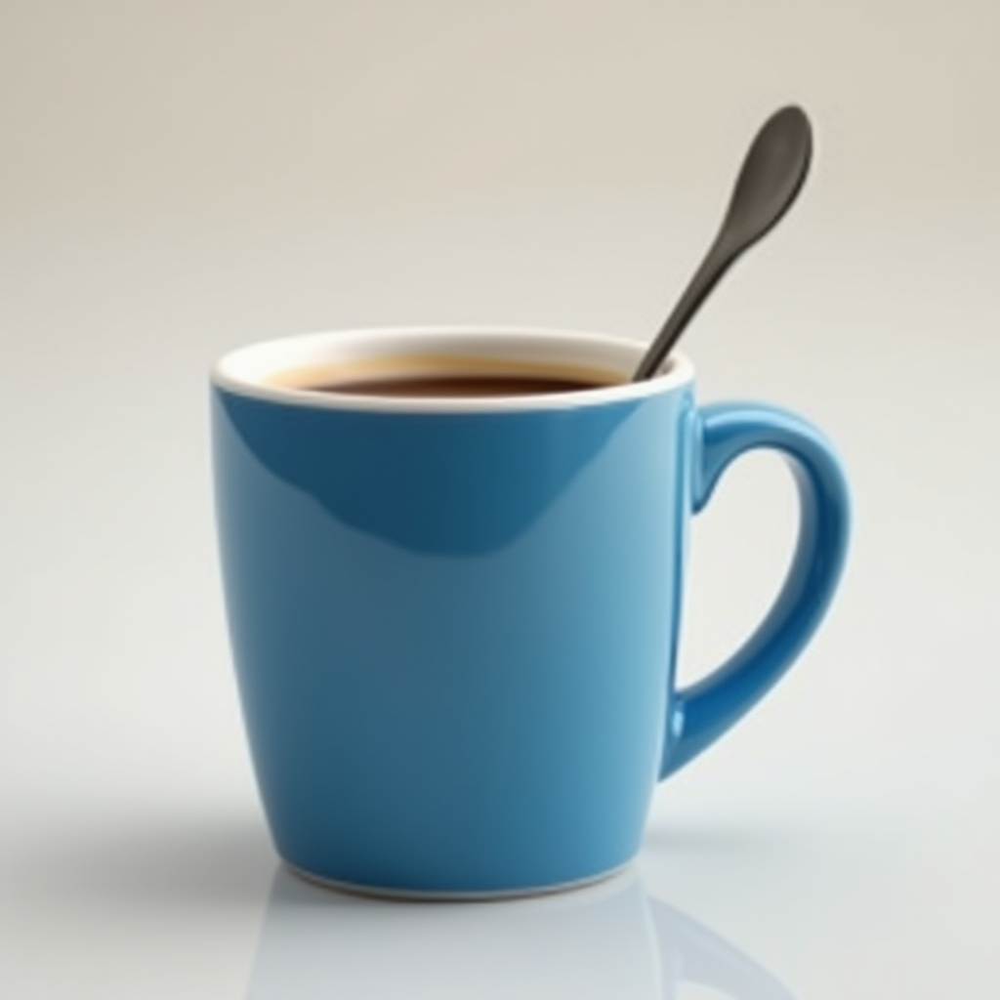

a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table
----------


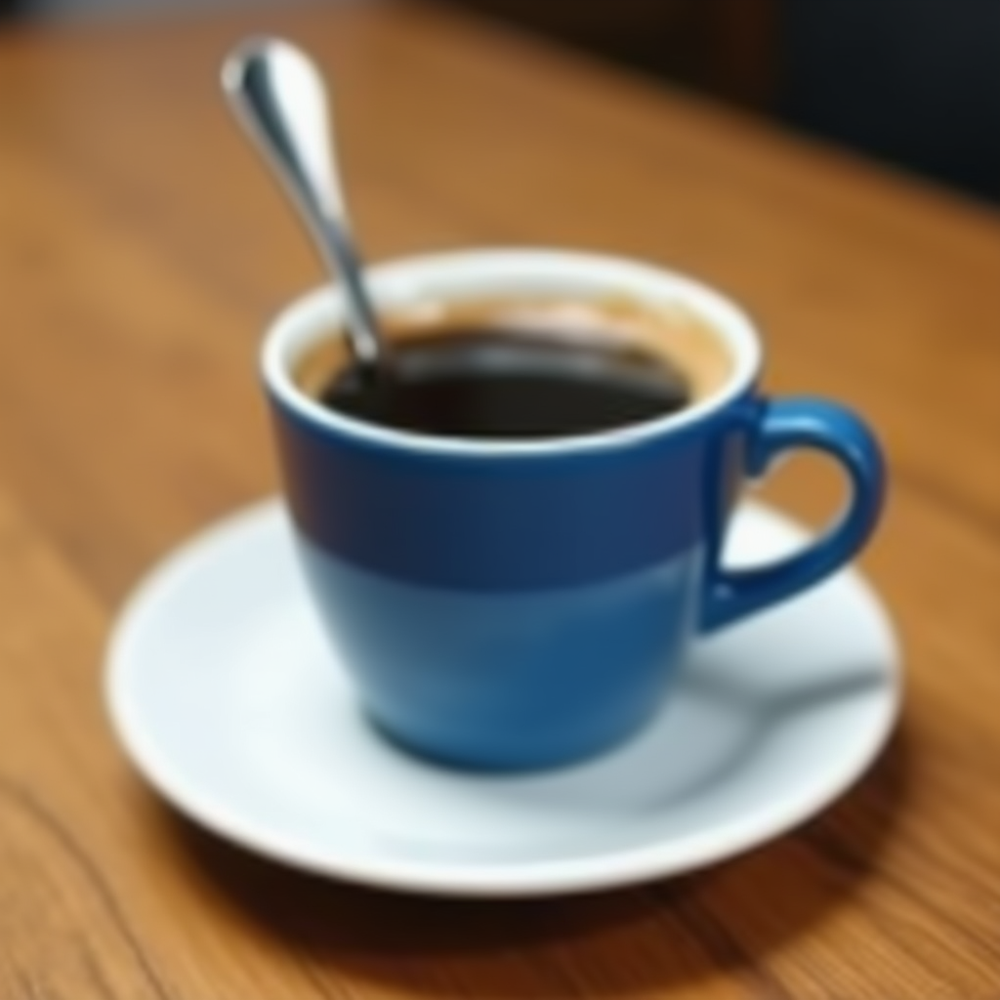

a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table with a stack of books next to it
----------


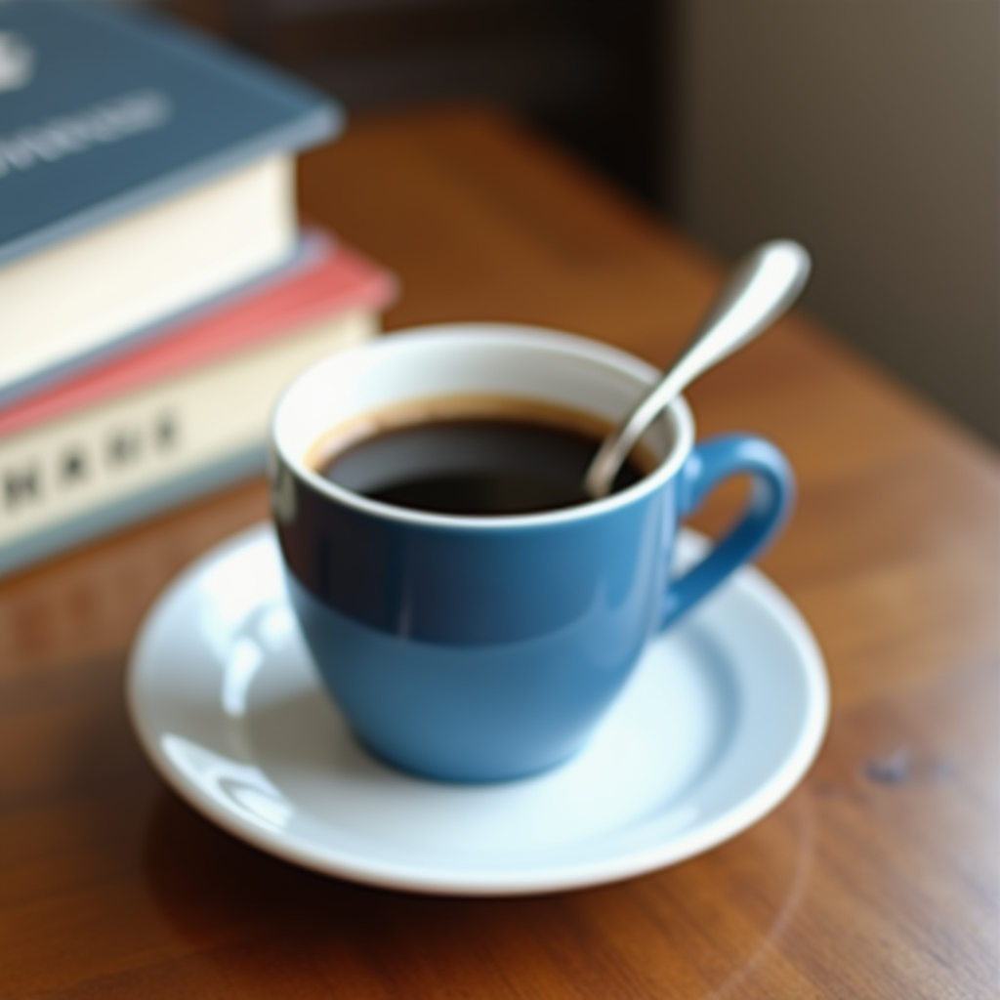

a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table with a stack of books next to it and a small vase with flowers on the table
----------


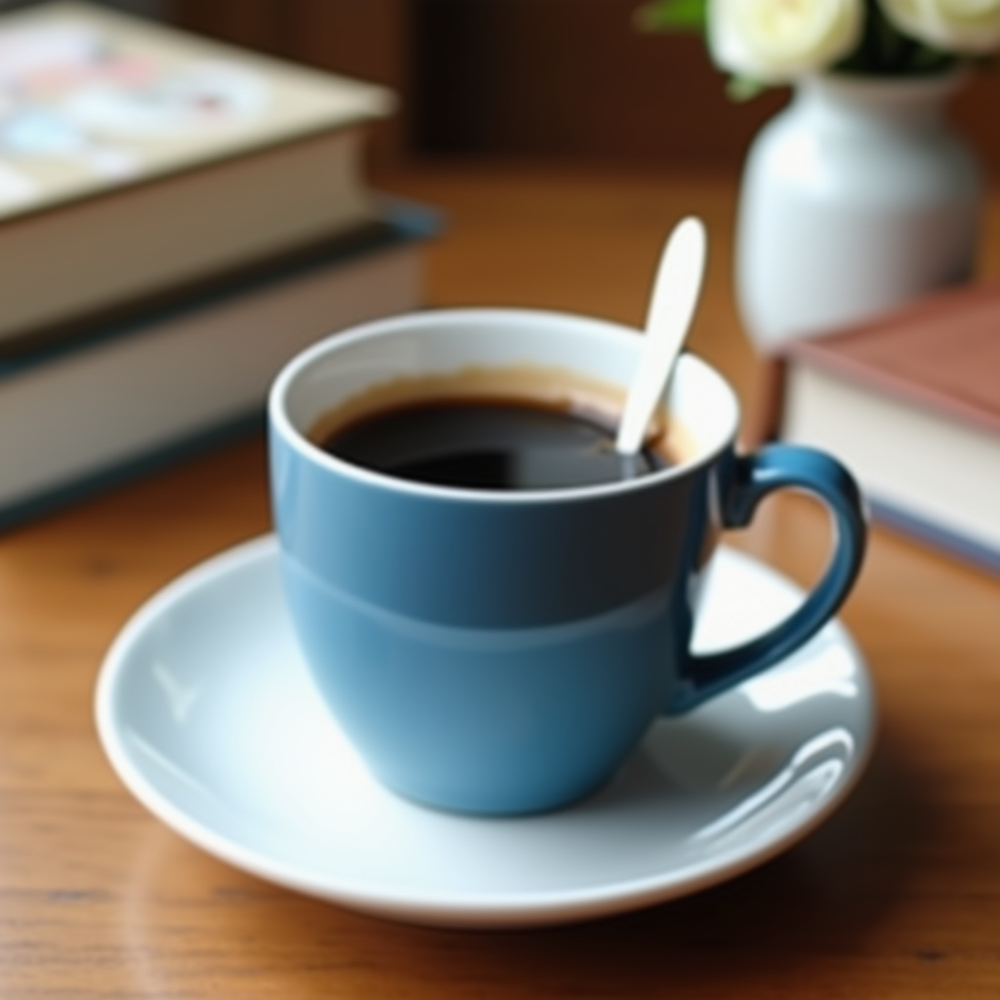

a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table with a stack of books next to it and a small vase with flowers on the table. An orange cat sits on the table in front of the coffee.
----------


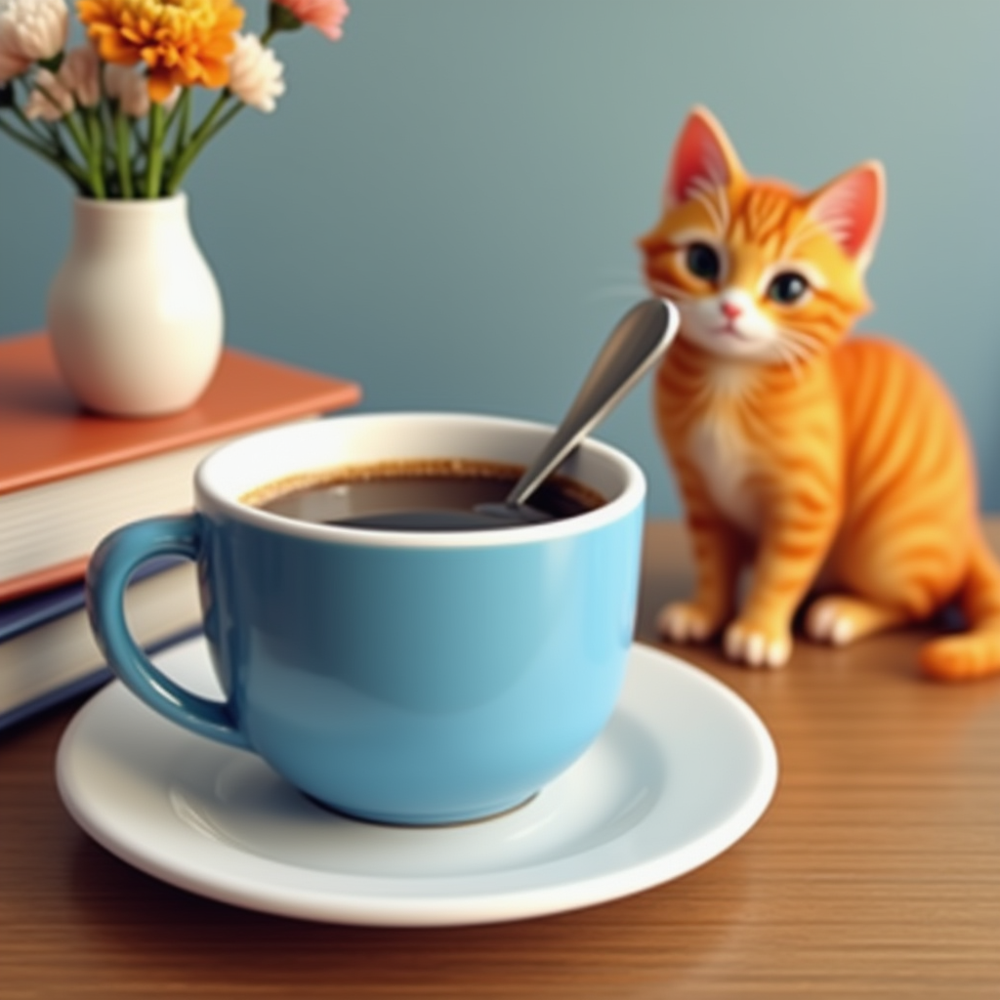

In [21]:
# prompt = "A female cosplayer portraying an ethereal fairy or elf, wearing a flowing dress made of delicate fabrics in soft, mystical colors like emerald green and silver. She has pointed ears, a gentle, enchanting expression, and her outfit is adorned with sparkling jewels and intricate patterns. The background is a magical forest with glowing plants, mystical creatures, and a serene atmosphere."

for prompt in prompts:
    print(prompt)
    print('-' * 10)
    output_dict = inferencer(text=prompt, **inference_hyper)
    display(output_dict['image'])

## Image Generation with Think

In [24]:
inference_hyper=dict(
    think=True,
    max_think_token_n=1000,
    do_sample=False,
    # text_temperature=0.3,
    cfg_text_scale=4.0,
    cfg_img_scale=1.0,
    cfg_interval=[0.4, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=1.0,
    cfg_renorm_type="global",
)

a car made of small cars
----------


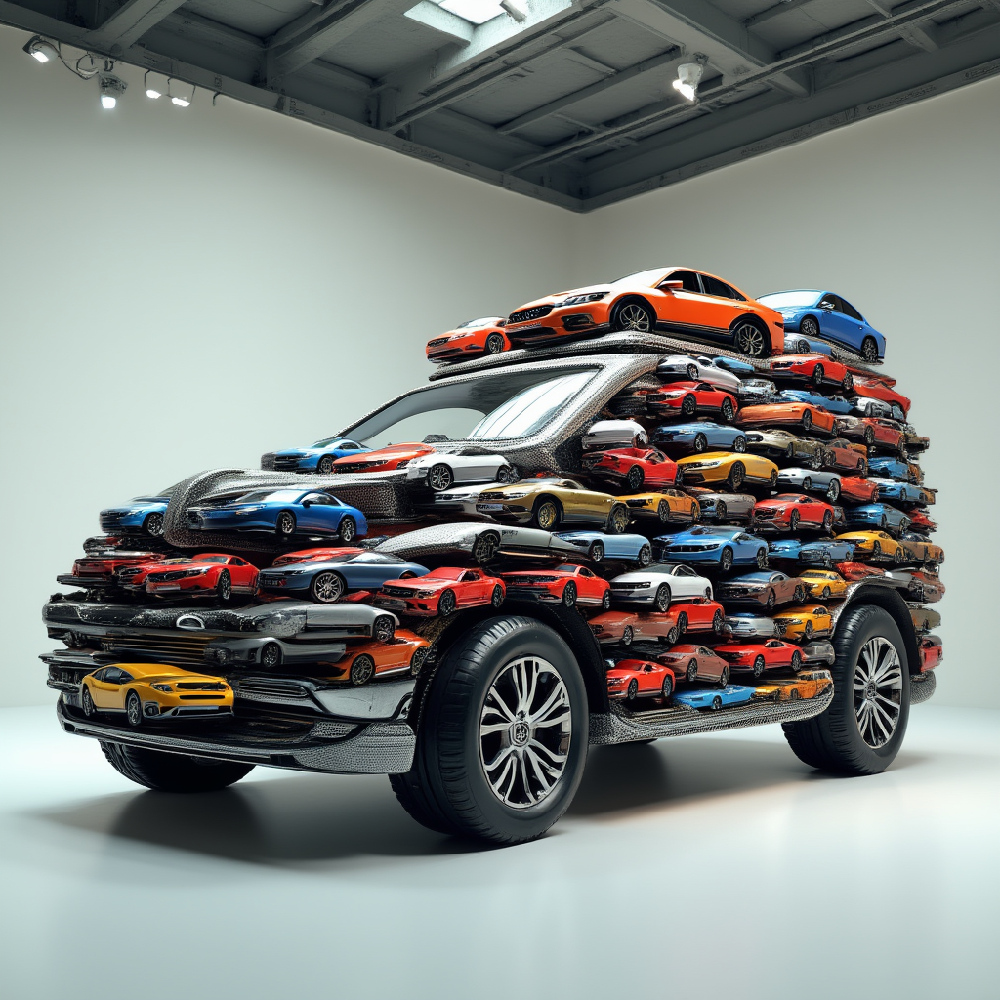

Thinking: <think>
The model should generate an image of a large car composed entirely of smaller cars arranged in a cohesive structure, demonstrating a creative and unconventional design.
Here’s the full, detailed prompt: A massive, intricately designed car composed entirely of smaller cars arranged in a seamless, cohesive structure, showcasing a creative and unconventional design. The smaller cars are tightly packed together, forming a unified, oversized vehicle with smooth, polished surfaces and vibrant, detailed paintwork. The scene is set in a spacious, well-lit studio with neutral, soft lighting that highlights the craftsmanship and scale of the arrangement. The perspective is slightly elevated, emphasizing the grandeur and complexity of the design, with a focus on the texture and alignment of the smaller cars. Ultra-realistic, highly detailed, and visually striking.
</think>


In [ ]:
# Their original example 
prompt = 'a car made of small cars'
print(prompt)
print('-' * 10)
output_dict = inferencer(text=prompt, **inference_hyper)
display(output_dict['image'])
print(f"Thinking: {output_dict['text']}")

a blue and white mug of coffee with a spoon inside
----------


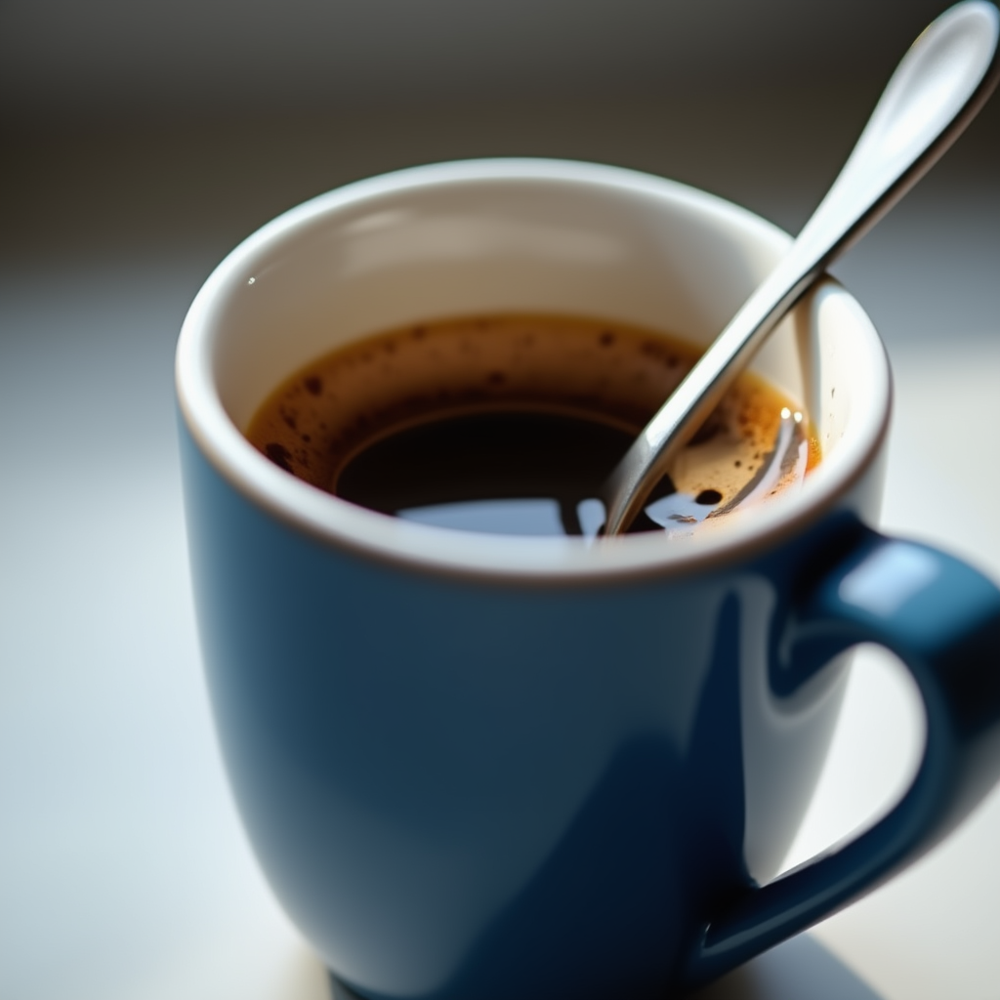

Thinking: <think>
The model should generate an image showing the coffee in the mug appearing darker at the bottom due to the spoon's stirring action, with the liquid slightly disturbed around the spoon.
Here’s the finished detailed prompt: A close-up, ultra-realistic image of a blue and white ceramic mug filled with coffee, with the liquid appearing darker at the bottom due to the stirring action caused by a silver spoon partially submerged in the coffee. The spoon's handle is visible, and the liquid around it is slightly disturbed, creating subtle ripples and reflections. The scene is well-lit with soft, natural lighting, emphasizing the glossy texture of the mug and the rich, dark tones of the coffee. The background is minimal and slightly blurred, ensuring the focus remains on the mug and its contents.
</think>
a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table
----------


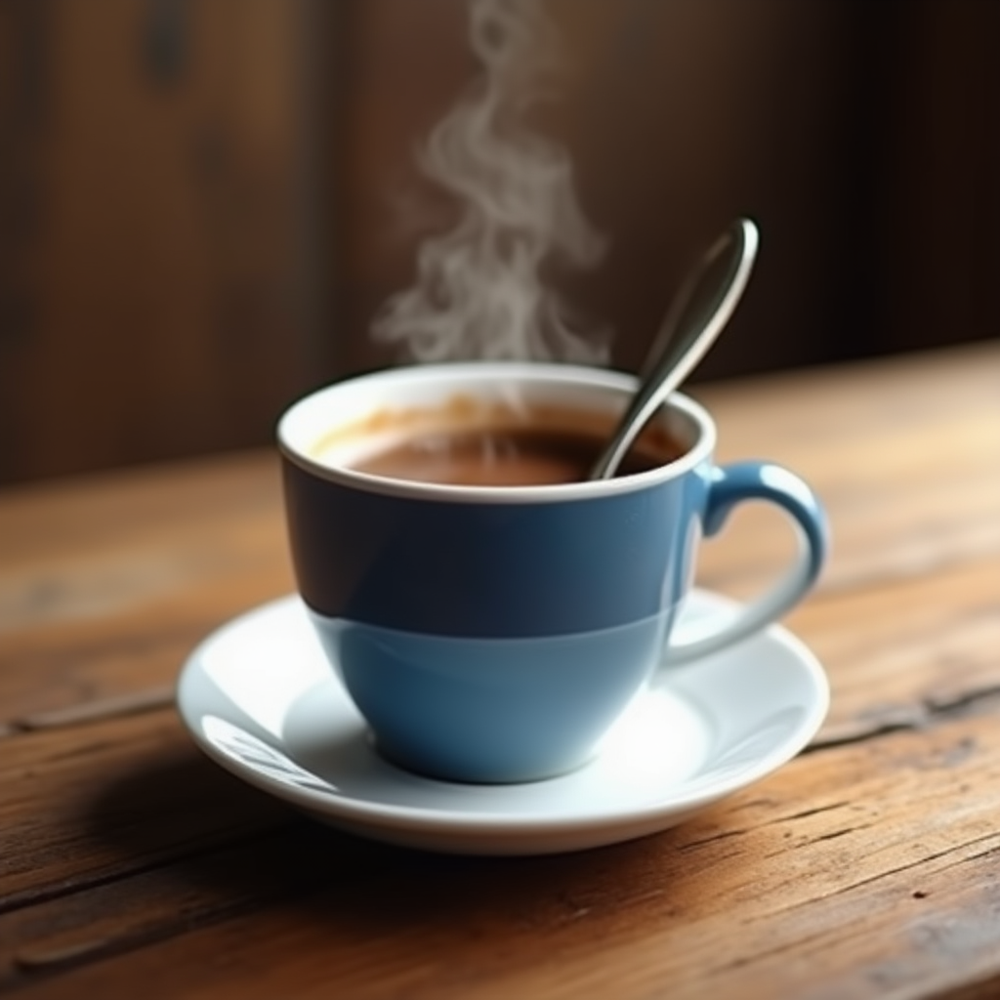

Thinking: <think>
The model should generate an image of a blue and white mug filled with coffee, with a spoon inside, placed on a white saucer on a wooden table.
Here’s the finished detailed prompt: A blue and white ceramic mug filled with steaming coffee, featuring a silver spoon resting inside, sits elegantly on a pristine white saucer atop a rustic wooden table. The scene is softly lit with warm, natural lighting, creating a cozy and inviting atmosphere. The mug and saucer are detailed with subtle texture and a glossy finish, while the wooden table has a rich, earthy tone with visible grain patterns. The image is ultra-realistic, with sharp focus on the mug and saucer, and a slight bokeh effect in the background to enhance depth and warmth.
</think>
a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table with a stack of books next to it
----------


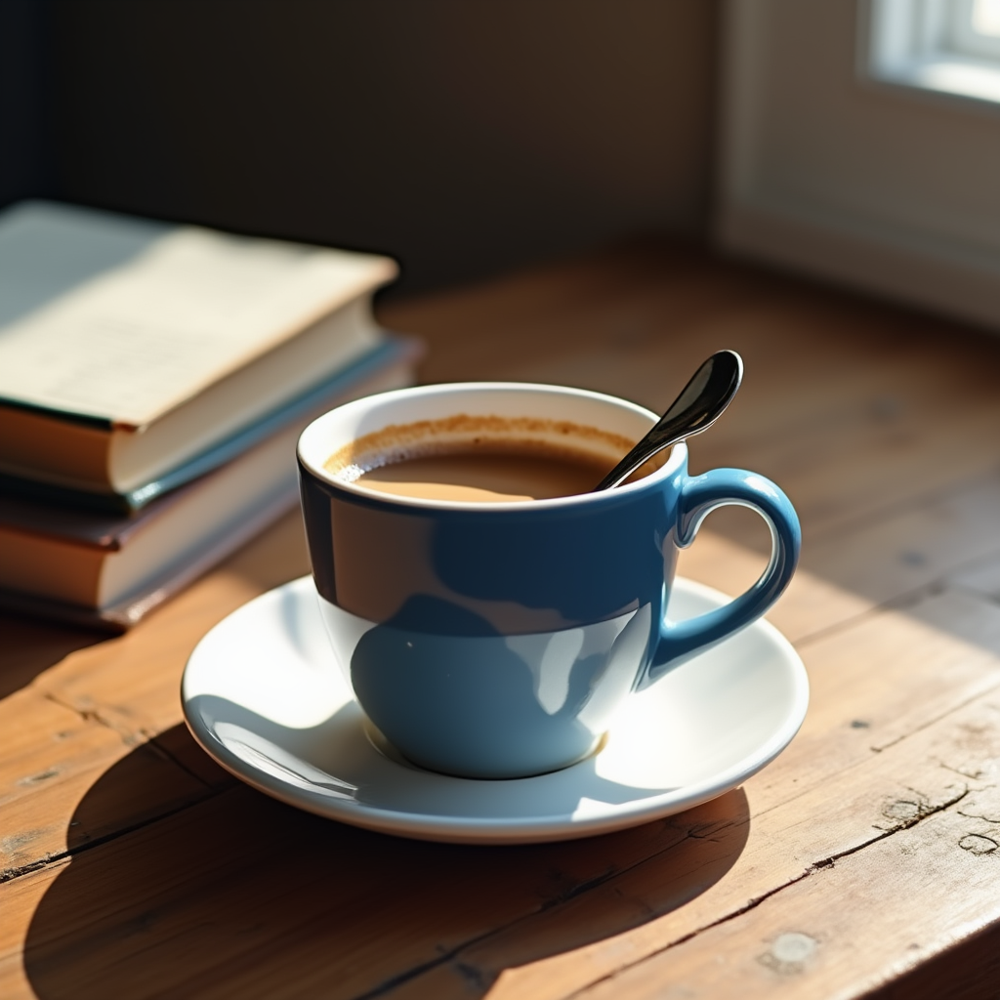

Thinking: <think>
The model should generate an image of a blue and white mug of coffee with a spoon inside, placed on a white saucer, on a wooden table, with a stack of books nearby.
Here’s the finished detailed prompt: A blue and white ceramic mug filled with coffee, containing a silver spoon resting inside, sits on a pristine white saucer atop a rustic wooden table. Beside the saucer, a neatly stacked pile of books with varied covers and textures is arranged, creating a cozy and inviting atmosphere. The scene is softly lit with warm, natural light, casting gentle shadows and highlighting the smooth surfaces of the mug, saucer, and books. The overall mood is calm and serene, with a focus on the harmonious interplay of colors and textures, captured in ultra-realistic detail.
</think>
a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table with a stack of books next to it and a small vase with flowers on the table
----------


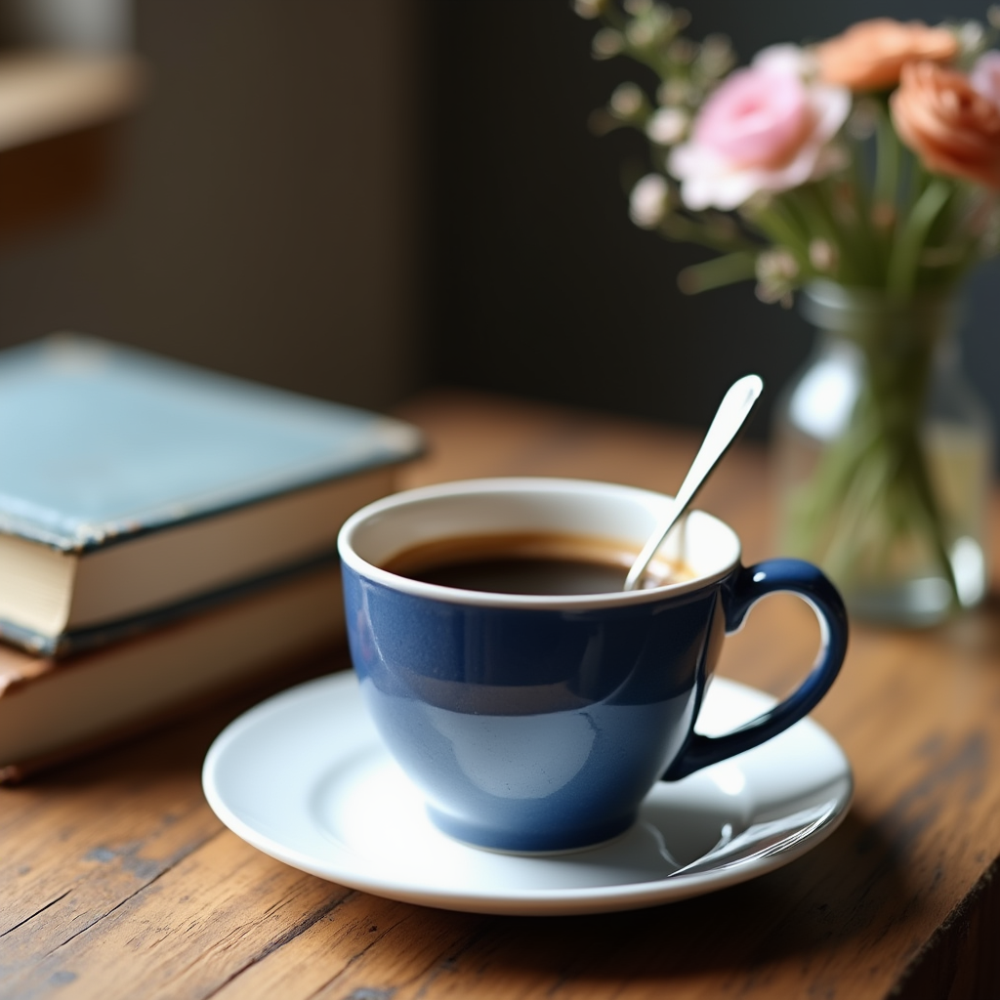

Thinking: <think>
The model should generate an image of a blue and white mug of coffee with a spoon inside, placed on a white saucer on a wooden table, with a stack of books and a small vase with flowers nearby.
Here’s the finished detailed prompt: A blue and white ceramic mug filled with coffee, containing a silver spoon, sits on a pristine white saucer atop a rustic wooden table. Beside the mug, a stack of hardcover books is neatly arranged, their spines visible, while a small, delicate vase holds a bouquet of fresh flowers, adding a touch of natural elegance. The scene is softly lit with warm, diffused natural light, creating a cozy and inviting atmosphere. The composition is ultra-realistic, with fine details such as the texture of the wood, the subtle reflections on the mug, and the delicate petals of the flowers, all captured in a harmonious and balanced arrangement.
</think>
a blue and white mug of coffee with a spoon inside sitting on a white saucer on a wooden table with a sta

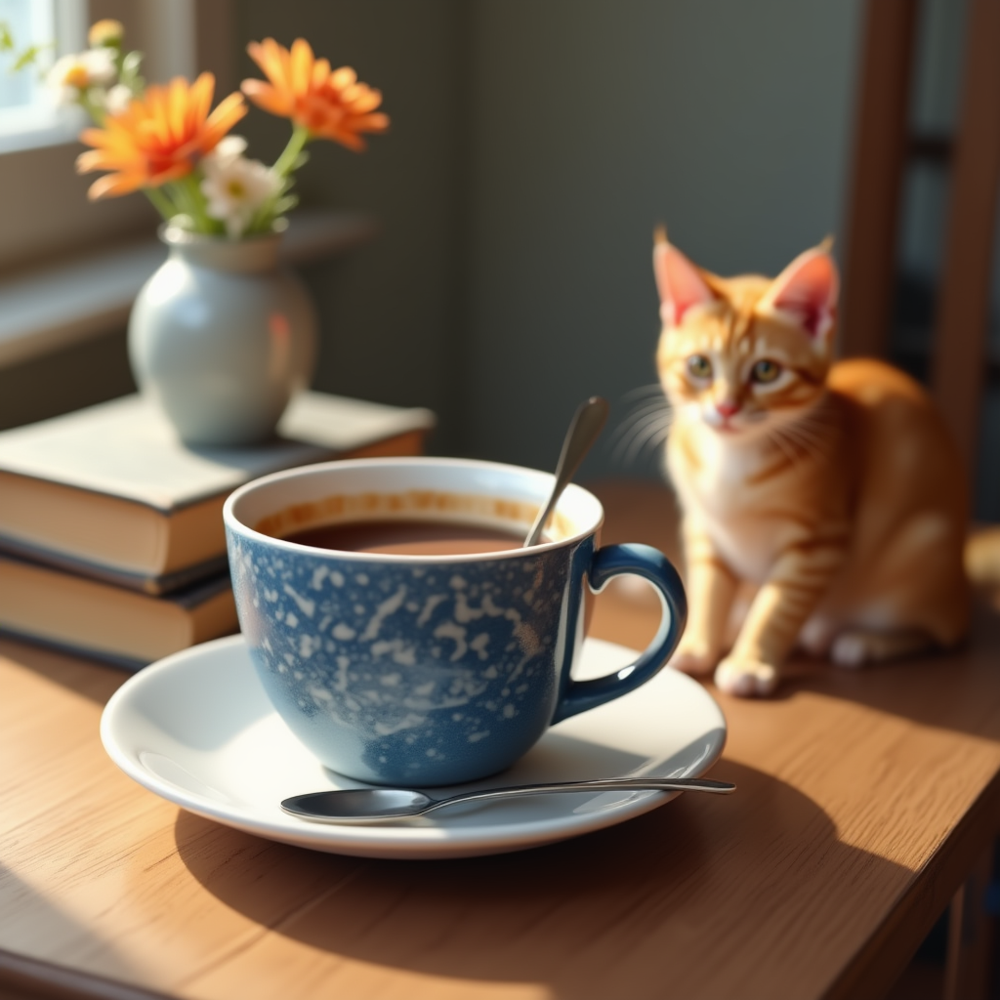

Thinking: <think>
The model should generate an image where the orange cat is positioned in front of the coffee mug, creating a sense of depth and interaction between the cat and the mug.
Here’s the finished detailed prompt: A cozy scene featuring a wooden table with a white saucer holding a blue and white ceramic coffee mug filled with steaming coffee, a silver spoon resting inside the mug, and a stack of books neatly arranged beside it. A small vase with delicate flowers sits nearby, adding a touch of natural charm. In the foreground, an orange cat sits comfortably on the table, its fur glowing warmly in soft, natural light. The composition emphasizes depth and interaction, with the cat positioned directly in front of the coffee mug, creating a harmonious and inviting atmosphere. The setting is warm and inviting, with a slightly blurred background to enhance focus on the table and its details, rendered in ultra-realistic detail with gentle shadows and a soft, diffused lighting effect.

In [26]:
for prompt in prompts:
    print(prompt)
    print('-' * 10)
    output_dict = inferencer(text=prompt, **inference_hyper)
    display(output_dict['image'])
    print(f"Thinking: {output_dict['text']}")

## Understanding

In [27]:
inference_hyper=dict(
    think=True,
    max_think_token_n=1000,
    do_sample=False,
    # text_temperature=0.3,
)

mmvp = [
    ("Is the ladybug positioned upright or upside down? (a) Upright (b) Upside down", 'mmvp_imgs/ladybug_down.jpg'), 
    ("Is the ladybug positioned upright or upside down? (a) Upright (b) Upside down", 'mmvp_imgs/ladybug_up.jpg'),
    ("Does the snowman in the picture have a mouth? (a) Yes (b) No", 'mmvp_imgs/snowman_mouth.jpg'),
    ("Does the snowman in the picture have a mouth? (a) Yes (b) No", 'mmvp_imgs/snowman_no_mouth.jpg'),
    ("Has the peacock opened its tail? (a) Yes (b) No", 'mmvp_imgs/peacock_closed.jpg'),
    ("Has the peacock opened its tail? (a) Yes (b) No", 'mmvp_imgs/peacock_open.jpg')
]

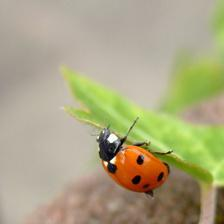

Is the ladybug positioned upright or upside down? (a) Upright (b) Upside down
----------
<think>
Okay, let's see. The question is asking whether the ladybug in the picture is positioned upright or upside down. The options are (a) Upright or (b) Upside down. Hmm. I need to figure this out based on the image provided.

First, I should look at the image carefully. The ladybug is on a green leaf, right? The background is blurred, so the focus is on the ladybug and the leaf. The ladybug's body is orange with black spots. The head is black, and there's a white marking on the head. The legs are visible, and it seems like the ladybug is clinging to the leaf.

Now, the key here is to determine the orientation of the ladybug. Is its head pointing upwards or downwards? If the ladybug is upright, its head would be facing upwards, and its legs would be hanging down. If it's upside down, the head would be pointing downwards, and the legs would be pointing upwards.

Looking at the image, the ladybug'

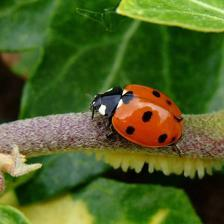

Is the ladybug positioned upright or upside down? (a) Upright (b) Upside down
----------
<think>
Okay, let's see. The question is asking whether the ladybug in the picture is positioned upright or upside down. The options are (a) Upright or (b) Upside down. Hmm. I need to look at the image carefully.

First, I should recall what "upright" and "upside down" mean. Upright would mean the ladybug is facing the right way, with its head pointing forward, legs on the ground, and its back facing upwards. Upside down would mean the opposite: the head is pointing downward, legs are in the air, and the back is facing the ground.

Looking at the image, the ladybug is on a branch. Let me visualize the picture. The ladybug's body is red with black spots. The head is black with white markings. The legs are visible, and it seems to be on the branch. Now, the key is to determine the orientation of the ladybug's body relative to the branch and the background.

Wait, the ladybug is on the branch, which i

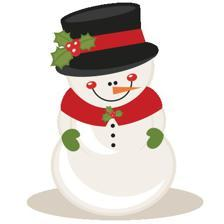

Does the snowman in the picture have a mouth? (a) Yes (b) No
----------
<think>
Okay, let's see. The question is whether the snowman in the picture has a mouth. The options are (a) Yes or (b) No. I need to look at the image carefully.

First, I'll start by examining the snowman's face. Snowmen are typically made with three snowballs stacked on top of each other. The top one is the head, the middle is the body, and the bottom is the base. The head usually has features like eyes, a nose, and a mouth.

Looking at the image, the snowman's face is on the top snowball. The eyes are two small black dots, and there's a carrot nose. Now, where would the mouth be? Usually, a mouth is drawn below the nose. Let me check the image again. The snowman has a wide, curved smile. Wait, is that a mouth? It looks like a smiley face, which is often considered a mouth. So, the mouth is present.

But wait, sometimes people might not consider the smile as a mouth. But in the context of a snowman, the smile is

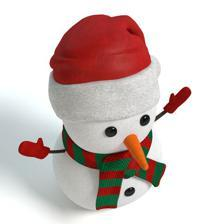

Does the snowman in the picture have a mouth? (a) Yes (b) No
----------
<think>
Okay, let's see. The question is whether the snowman in the picture has a mouth. The options are yes or no. I need to look at the image carefully.

First, I'll start by examining the snowman's face. Snowmen are typically made with three snowballs stacked on top of each other. The top one is the head, the middle is the body, and the bottom is the base. The head usually has features like eyes, a nose, and sometimes a mouth.

Looking at the image, the snowman has a carrot nose, which is common. The eyes are two black dots, probably made from buttons or coal. Now, the mouth. I need to check if there's any indication of a mouth. Sometimes snowmen have a simple smile made with a carrot or a stick, but in this case, the carrot is just the nose. The mouth might be represented by a small detail, like a line or a different object.

Wait, the snowman is wearing a scarf and a hat. The scarf is green and red striped, an

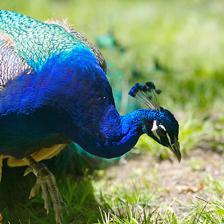

Has the peacock opened its tail? (a) Yes (b) No
----------
<think>
Okay, let's see. The question is whether the peacock has opened its tail. The image shows a peacock, but I need to check if its tail is spread out or not. 

First, I'll look at the image. The peacock is in a natural setting, maybe a garden or a park. The bird is facing to the right, and its head is slightly lowered, as if it's pecking at the ground. The body is mostly visible, showing the vibrant blue and green feathers. But the tail feathers are not fully fanned out. They seem to be partially spread, but not as wide as when a peacock is displaying. 

Wait, the question is about whether the tail is opened. So, if the tail is spread out, even partially, then the answer would be yes. But if it's not spread at all, then no. In the image, the peacock's tail is not fully open. The tail feathers are visible but not fanned out in the typical display manner. So, the answer should be no. 

But let me double-check. Sometimes, eve

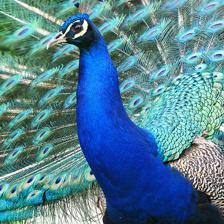

Has the peacock opened its tail? (a) Yes (b) No
----------
<think>
Okay, let's see. The question is whether the peacock has opened its tail. The image shows a peacock, and I need to determine if its tail is spread out. 

First, I'll look at the image. The peacock is facing to the left, and its body is prominently displayed. The tail feathers are visible, but I need to check if they are fully fanned out. The peacock's tail is usually the most striking part, with those long, colorful feathers. 

In the image, the tail feathers are spread out behind the bird. The eye-like patterns on the feathers are clearly visible, which is a characteristic feature of a peacock's tail when it's open. The feathers are fanned out in a semicircle, which is typical when a peacock is displaying. 

Wait, but sometimes peacocks might not open their tails completely. However, in this image, the tail appears to be fully extended. The background shows more of the tail feathers, indicating that they are spread out

In [28]:
# image = Image.open('test_images/meme.jpg')
# prompt = "Can someone explain what’s funny about this meme??"

for vqa in mmvp:
    image = Image.open(vqa[1]) 
    prompt = vqa[0]
    display(image)
    print(prompt)
    print('-'*10)
    output_dict = inferencer(image=image, text=prompt, understanding_output=True, **inference_hyper)
    print(output_dict['text'])

## Editing

In [ ]:
inference_hyper=dict(
    cfg_text_scale=4.0,
    cfg_img_scale=2.0,
    cfg_interval=[0.0, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=1.0,
    cfg_renorm_type="text_channel",
)

In [ ]:
image = Image.open('test_images/women.jpg')
prompt = 'She boards a modern subway, quietly reading a folded newspaper, wearing the same clothes.'

display(image)
print(prompt)
print('-'*10)
output_dict = inferencer(image=image, text=prompt, **inference_hyper)
display(output_dict['image'])

## Edit with Think

In [ ]:
inference_hyper=dict(
    max_think_token_n=1000,
    do_sample=False,
    # text_temperature=0.3,
    cfg_text_scale=4.0,
    cfg_img_scale=2.0,
    cfg_interval=[0.0, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=0.0,
    cfg_renorm_type="text_channel",
)

In [ ]:
image = Image.open('test_images/octupusy.jpg')
prompt = 'Could you display the sculpture that takes after this design?'

display(image)
print('-'*10)
output_dict = inferencer(image=image, text=prompt, think=True, **inference_hyper)
print(output_dict['text'])
display(output_dict['image'])